In [1]:
import pandas as pd 
import pickle
import torch
import umap
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as pl

def to_pickle(df, f):
    with open(f, 'wb') as fname:
        pickle.dump(df, fname)

def open_pickle(f):
    with open(f, 'rb') as file:
        data = pickle.load(file)
    return data

In [2]:
phekg_cui_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_cui_dict.pkl")
phekg_icd_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_icd_dict.pkl")
phekg_atc_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_atc_dict.pkl")
phekg_snomed_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_snomed_dict.pkl")
phekg_phecode_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_phecode_dict.pkl")
phekg_rxnorm_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_rxnorm_dict.pkl")
phekg_lnc_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_lnc_dict.pkl")
phekg_cpt_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_cpt_dict.pkl")

phekg_all_dict = {
    'UMLS_CUI': phekg_cui_dict,
    'ICD10CM': phekg_icd_dict,
    'SNOMEDCT_US': phekg_snomed_dict,
    'RXNORM': phekg_rxnorm_dict, 
    'ATC': phekg_atc_dict,
    'PHECODE': phekg_phecode_dict,
    'LNC': phekg_lnc_dict,
    'CPT': phekg_cpt_dict
}

## Phecode and ATC

In [5]:
phekg_node_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/connected_node_v3_df.csv", sep='\t')
phekg_node_df['n_len'] = phekg_node_df['node_id'].str.split(':', expand=True)[0].str.strip().str.len()
phekg_node_df['first_char'] = phekg_node_df['node_id'].str.slice(0, 1).copy()
phekg_node_df['original_code'] = phekg_node_df['node_id'].str.split(':', expand=True)[0]

phecode_defn_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/construct_kg/phekg/phecode_definitions1.2.csv")
phecode_defn_df.loc[phecode_defn_df['category'] == 'mental disorders', 'category'] = 'mental_disorders/neuro'
phecode_defn_df.loc[phecode_defn_df['category'] == 'neurological', 'category'] = 'mental_disorders/neuro'

concat_list = []

# list of phecode indices
keep_cat_list = ['endocrine/metabolic',
       'hematopoietic', 'mental disorders', 'neurological',
       'sense organs',  'digestive', 'neoplasms',
       'genitourinary', 'dermatologic', 'respiratory', 'circulatory system',
       'musculoskeletal', "mental_disorders/neuro"]

phecode_df = phekg_node_df.loc[phekg_node_df['ntype'] == 'PHECODE']
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].str.split(':', expand=True)[0].astype(float))
phecode_df = phecode_df.merge(phecode_defn_df[['category', 'phecode']], left_on='node_id', right_on='phecode', how='left')
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(str))

phecode_inds = phecode_df.loc[phecode_df['category'].isin(keep_cat_list)]['node_index'].values.tolist()
phecode_map_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/data/Phecode_map_v1_2_icd9_icd10cm_09_30_2024.csv")
phecode_map_df['phecode'] = phecode_map_df['Phecode'].copy()
phecode_defn_df = phecode_defn_df[['phecode', 'category']].merge(phecode_map_df.loc[phecode_map_df['Flag'] == 10]
, on='phecode')
phecode_defn_df = phecode_defn_df.loc[phecode_defn_df['category'].isin(keep_cat_list)]

In [6]:
# list of ATC indices
atc_df = phekg_node_df.loc[phekg_node_df['ntype'] == 'ATC']
atc_df = atc_df.assign(category=atc_df['node_id'].str.slice(0,1))
keep_atc_list = ['A', 'B', 'C', 'D', 'G', 'H','M', 'N','R', 'S']
atc_inds = atc_df.loc[(atc_df['category'].isin(keep_atc_list)) & 
                      (atc_df['n_len']==5)]['node_index'].values.tolist()

In [7]:
part_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/umap/Part.csv")
system_part_list = part_df.loc[part_df['PartTypeName'] == 'COMPONENT']['PartNumber'].values
system_part_inds = phekg_node_df.loc[phekg_node_df['original_code'].isin(system_part_list)]['original_code'].values.tolist()

In [8]:
phemap_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/construct_kg/phekg/PheMap_Mapped_Terminologies_1.1.csv", sep=',')
phemap_cpt = phemap_df.loc[phemap_df['SOURCE'] == 'CPT']['CODE'].tolist()
phemap_lnc = phemap_df.loc[phemap_df['SOURCE'] == 'LNC']['CODE'].tolist()
phemap_rxnorm = phemap_df.loc[phemap_df['SOURCE'] == 'RXNORM']['CODE'].tolist()

In [9]:
icd_inds = phekg_node_df.loc[(phekg_node_df['ntype']=='ICD10CM') & (phekg_node_df['original_code'].str.len() <= 4)]['node_index'].tolist()

In [10]:
phecode_defn_df['phecode'] = phecode_defn_df['phecode'].astype(str)

In [231]:
concat_list = []
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(phecode_inds)])
#concat_list.append(phekg_node_df.loc[phekg_node_df['original_code'].isin(phemap_rxnorm) & (phekg_node_df['ntype']=='RXNORM')])
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(atc_inds)])
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(icd_inds)])
#concat_list.append(phekg_node_df.loc[(phekg_node_df['original_code'].isin(system_part_inds)) & (phekg_node_df['original_code'].isin(phemap_lnc))])
#concat_list.append(phekg_node_df.loc[(phekg_node_df['ntype'] == 'CPT') & (phekg_node_df['original_code'].isin(phemap_cpt))])
subset_node_df = pd.concat(concat_list)

In [232]:
subset_node_df.shape

(2890, 7)

In [233]:
import numpy as np

embed_list = []
for i, row in subset_node_df.iterrows():
    ntype = row['ntype']
    node_index = row['node_id'].split(':')[0]
    embed_list.append(phekg_all_dict[ntype][node_index])

embed_mat = np.array(embed_list)
reducer = umap.UMAP(n_neighbors=35, min_dist=0.97, metric='cosine', n_components=4)
embedding_standard = reducer.fit_transform(embed_mat)


In [234]:
umap_df = subset_node_df.copy()
umap_df['0'] = embedding_standard[:, 2]
umap_df['1'] = embedding_standard[:, 1]

In [235]:
umap_df.shape

(2890, 9)

In [236]:
df1 = umap_df.merge(phecode_defn_df[['category', 'phecode']].drop_duplicates(), left_on='original_code', right_on='phecode', how='outer')
#df2 = umap_df.merge(phecode_defn_df[['category', 'ICD']].drop_duplicates(), left_on='original_code', right_on='ICD', how='inner')
umap_df = pd.concat([df1])
umap_df.shape

(2909, 11)

In [237]:
umap_df.head(1)

,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,category,phecode
0,145.0:phecode,Cancer of mouth,PHECODE,108576.0,5.0,1,145.0,7.514641,11.16183,neoplasms,145.0


In [238]:
fig_2d = px.scatter(
    umap_df, x='0', y='1', color='ntype',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [6]:
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

c_digest = "#264653"
c_musko = "#2a9d8f"
c_derm = "#6a4c93"
c_resp = "#e9c46a"
c_neuro='#f4a261'
c_endo="#e76f51"
c_circ="#1565c0"
c_urinary='#ef476f'
c_hemo="#E2BBE9"
c_sense='#7ABA78'
c_infec='brown'
c_default="#DDDDDD"

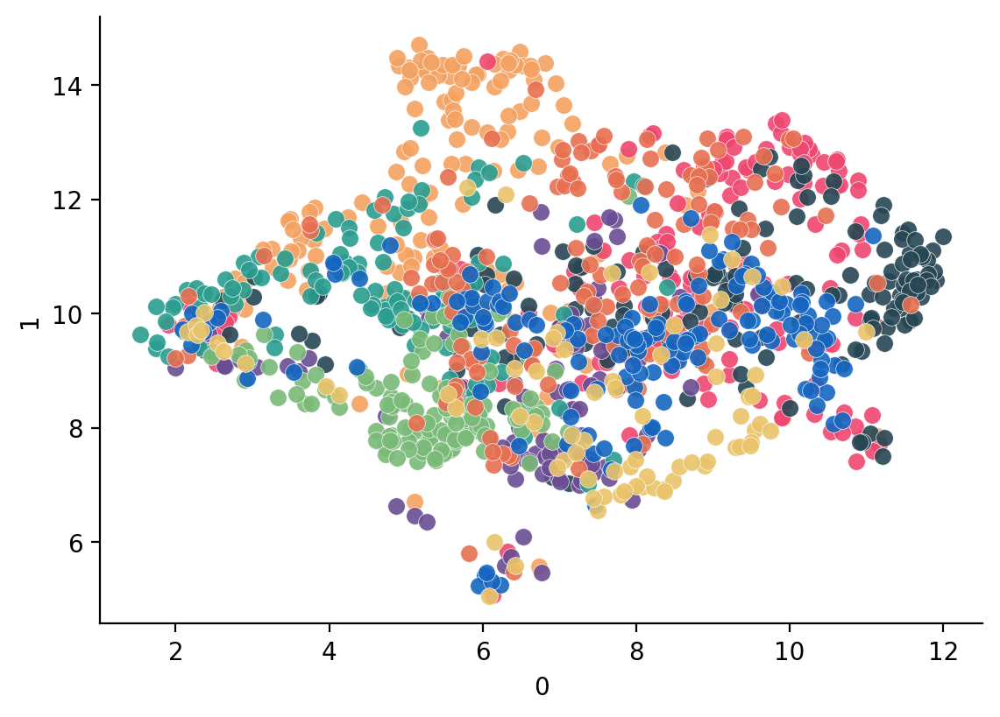

In [242]:
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

fig = plt.figure(figsize=(6.5, 4.5))
#sns.scatterplot(data=umap_df, x='0', y='1', 
#                color=c_default, alpha=0.6, s=40, linewidth=0.25, edgecolor='white')

#phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'neoplasms']['phecode'].astype(str).tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color='black', alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

#phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'neurological']['phecode'].astype(str).tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1',
#                color=c_neuro, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'mental_disorders/neuro']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_neuro, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'genitourinary']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_urinary, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'hematopoietic']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_hemo, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'digestive']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_digest, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'dermatologic']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_derm, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'musculoskeletal']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_musko, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'sense organs']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_sense, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'endocrine/metabolic']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_endo, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'circulatory system']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_circ, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phecode_defn_df.loc[phecode_defn_df['category'] == 'respiratory']['phecode'].astype(str).tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_resp, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

sns.despine(top=True)

In [241]:
fig.savefig("umap_phecode_revision.svg", dpi=450)

<Axes: xlabel='0', ylabel='1'>

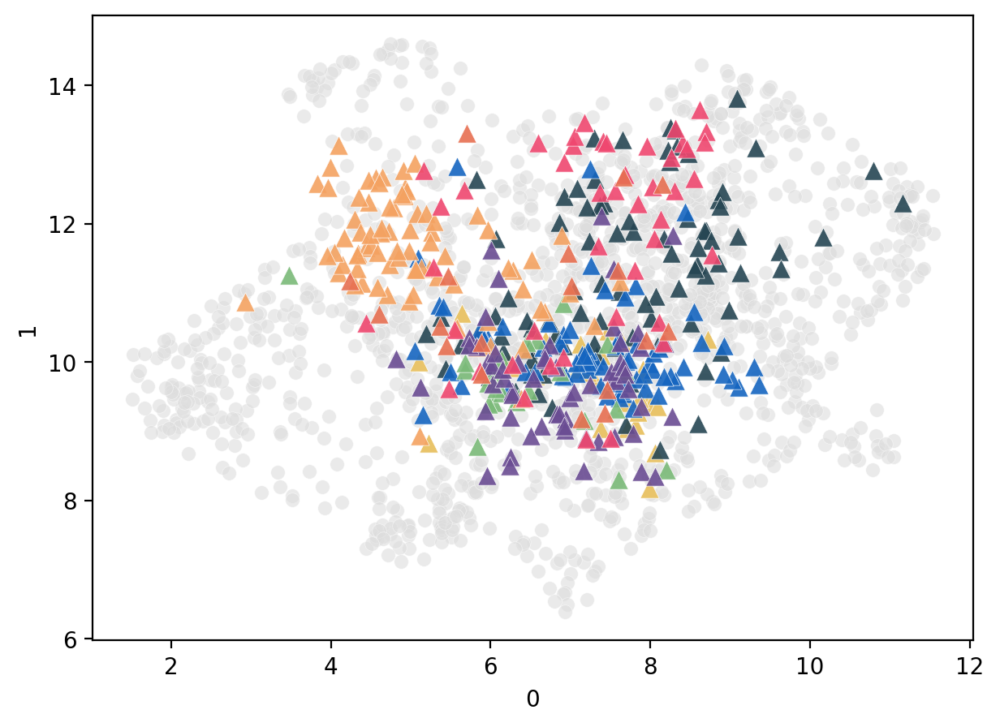

In [831]:
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.figure(figsize=(7.0, 5.))
sns.scatterplot(data=umap_df.loc[umap_df['ntype'] == 'PHECODE'], x='0', y='1', 
                color=c_default, alpha=0.6, s=40, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('R'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_resp, alpha=1.0, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('B'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_hemo, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('A'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_digest, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('M'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_musko, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('C'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_circ, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('S'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_sense, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('N'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1',
                color=c_neuro, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('D'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_derm, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('G'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_urinary, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('H'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_endo, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

In [836]:
len(subset_node_df)

10464

In [22]:
# list of ATC indices
atc_df = phekg_node_df.loc[phekg_node_df['ntype'] == 'ATC']
atc_df = atc_df.assign(category=atc_df['node_id'].str.slice(0,1))
keep_atc_list = ['A', 'B', 'C', 'D', 'G', 'H','M', 'N','R', 'S']
atc_inds = atc_df.loc[(atc_df['category'].isin(keep_atc_list)) & 
                      (atc_df['n_len']==7)]['node_index'].values.tolist()

concat_list = []
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(atc_inds)])
subset_node_df = pd.concat(concat_list)

import numpy as np

embed_list = []
for i, row in subset_node_df.iterrows():
    ntype = row['ntype']
    node_index = row['node_id'].split(':')[0]
    embed_list.append(phekg_all_dict[ntype][node_index])


In [ ]:
embed_mat = np.array(embed_list) # n_neighbors=35, min_dist=0.97
reducer = umap.UMAP(n_neighbors=90, min_dist=0.85, metric='cosine', n_components=3)
embedding_standard = reducer.fit_transform(embed_mat)

umap_df = subset_node_df.copy()
umap_df['0'] = embedding_standard[:, 2]
umap_df['1'] = embedding_standard[:, 1]


In [87]:
fig_2d = px.scatter(
    umap_df, x='0', y='1', color='first_char',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

<Axes: xlabel='0', ylabel='1'>

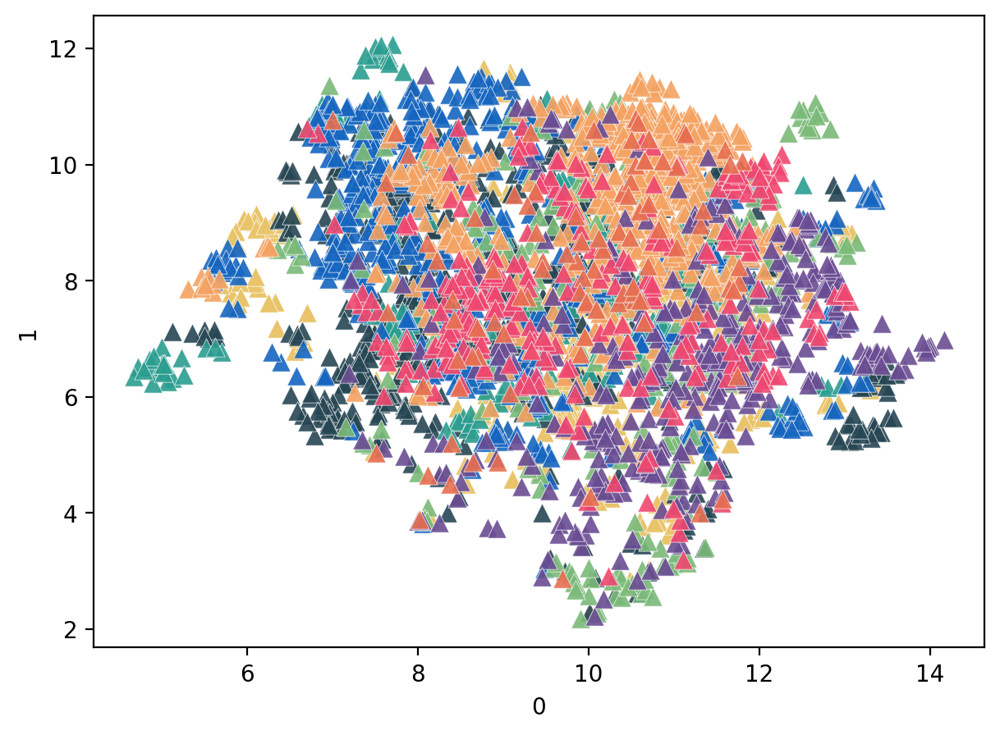

In [11]:
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.figure(figsize=(7.0, 5.))
sns.scatterplot(data=umap_df.loc[umap_df['ntype'] == 'PHECODE'], x='0', y='1', 
                color=c_default, alpha=0.6, s=40, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('R'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_resp, alpha=1.0, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('B'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_hemo, alpha=0.9, s=50, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('A'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_digest, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('M'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_musko, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('C'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_circ, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('S'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_sense, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('N'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1',
                color=c_neuro, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('D'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_derm, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('G'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_urinary, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('H'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_endo, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', marker='^')

<Axes: xlabel='0', ylabel='1'>

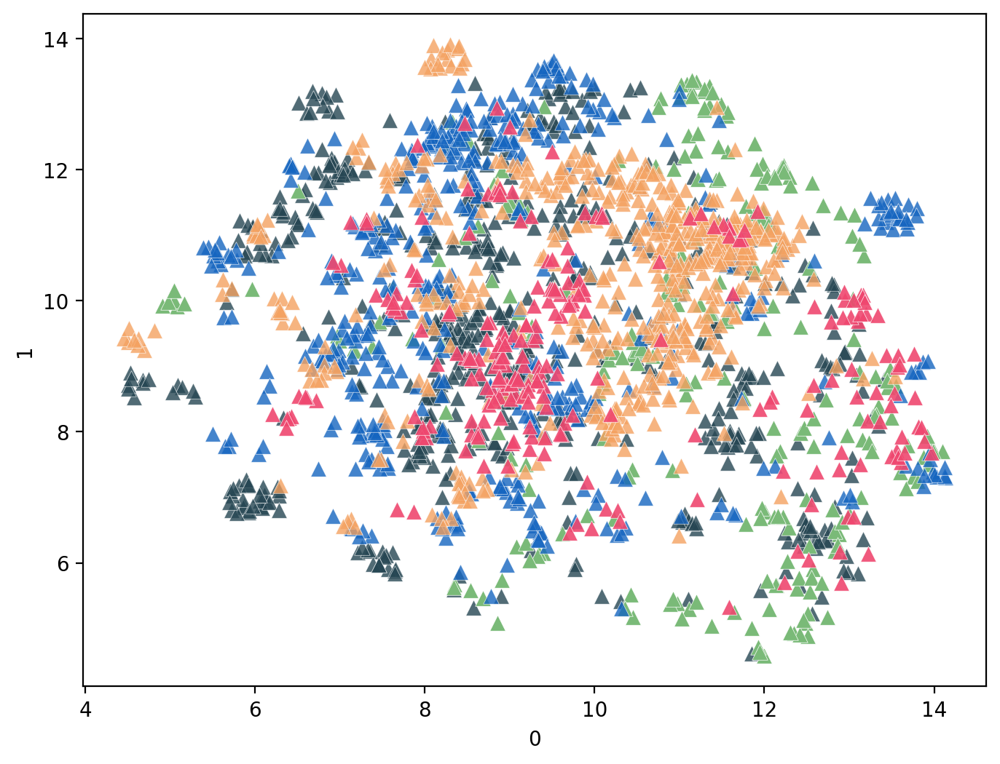

In [120]:
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

fig = plt.figure(figsize=(8.0, 6.))

s = 60

#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC')]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_default, alpha=1.0, s=s, linewidth=0.25, edgecolor='white')

#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('B'))]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_hemo, alpha=0.5, s=30, linewidth=0.25, edgecolor='white', marker='^')


#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('H'))]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_endo, alpha=0.9, s=s, linewidth=0.25, edgecolor='white')

#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('M'))]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_musko, alpha=0.8, s=s, linewidth=0.25, edgecolor='white')

#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('R'))]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_resp, alpha=1, s=s, linewidth=0.25, edgecolor='white')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('A'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_digest, alpha=0.8, s=s, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('S'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_sense, alpha=1, s=s, linewidth=0.25, edgecolor='white', marker='^')


phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('C'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_circ, alpha=0.8, s=s, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('N'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1',
                color=c_neuro, alpha=0.8, s=s, linewidth=0.25, edgecolor='white', marker='^')

phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']>=5) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('G'))]['original_code'].tolist()
cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
sns.scatterplot(data=cat_df, x='0', y='1', 
                color=c_urinary, alpha=0.9, s=s, linewidth=0.25, edgecolor='white', marker='^')

#phecode_cat_codes = phekg_node_df.loc[(phekg_node_df['n_len']==7) & (phekg_node_df['ntype']=='ATC') & (phekg_node_df['node_id'].str.startswith('D'))]['original_code'].tolist()
#cat_df = umap_df.loc[umap_df['original_code'].isin(phecode_cat_codes)]
#sns.scatterplot(data=cat_df, x='0', y='1', 
#                color=c_derm, alpha=1, s=s, linewidth=0.25, edgecolor='white')


In [121]:
fig.savefig("umap_atc_revision.svg", dpi=450)

In [17]:
digestive_icds = phecode_defn_df.loc[phecode_defn_df['PhecodeCategory'] == 'digestive']['ICD'].tolist()
digestive_icds += phekg_node_df.loc[(phekg_node_df['ntype'] == 'ICD10CM') & 
                                     (phekg_node_df['original_code'].str.startswith('K'))]['original_code'].tolist()

In [ ]:
icd_inds = phekg_node_df.loc[(phekg_node_df['ntype']=='ICD10CM') &
                            (phekg_node_df['original_code'].isin(digestive_icds))]['node_index'].tolist()

concat_list = []
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(icd_inds)])
subset_node_df = pd.concat(concat_list)

import numpy as np

embed_list = []
for i, row in subset_node_df.iterrows():
    ntype = row['ntype']
    node_index = row['node_id'].split(':')[0]
    embed_list.append(phekg_all_dict[ntype][node_index])
    
embed_mat = np.array(embed_list) # n_neighbors=35, min_dist=0.97
reducer = umap.UMAP(n_neighbors=40, min_dist=0.8, metric='cosine', n_components=3)
embedding_standard = reducer.fit_transform(embed_mat)

umap_df = subset_node_df.copy()
umap_df['0'] = embedding_standard[:, 0]
umap_df['1'] = embedding_standard[:, 1]

In [43]:
umap_df['second_char'] = umap_df['original_code'].str.slice(1,2)
umap_df['prefix'] = umap_df['original_code'].str.slice(0,2)

In [23]:
fig_2d = px.scatter(
    umap_df, x='0', y='1', color='first_char',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [30]:
fig_2d = px.scatter(
    umap_df, x='0', y='1', color='second_char',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

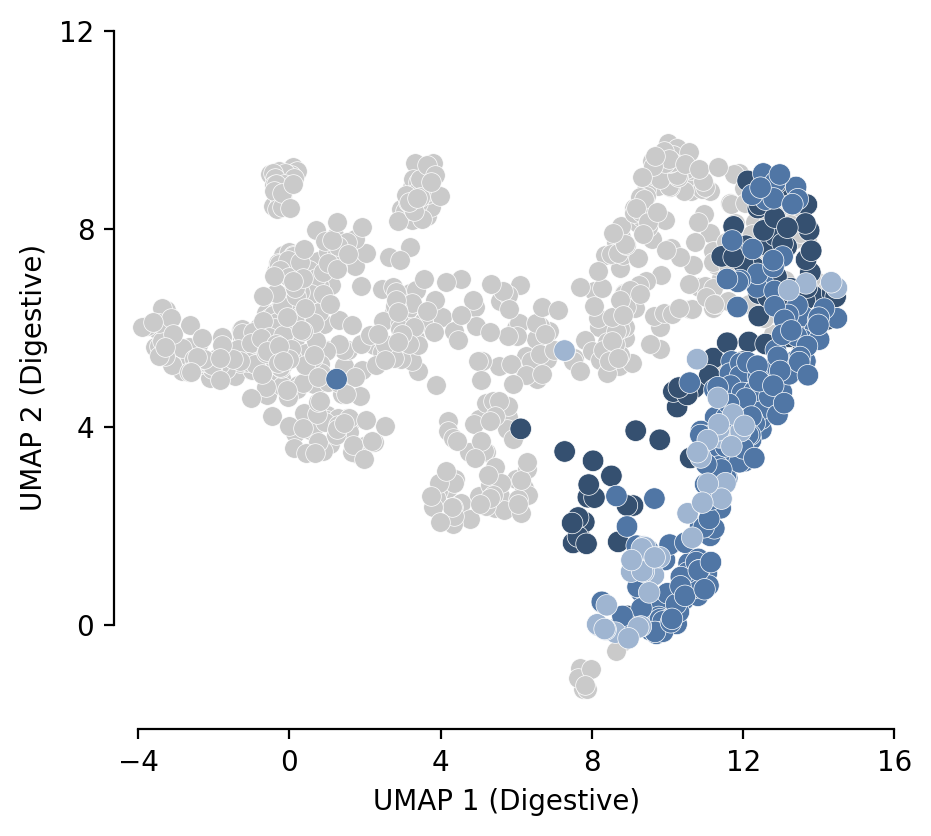

In [220]:
c_default = "#cacaca"

fig, ax = plt.subplots(figsize=(5,4.5))
sns.scatterplot(data=umap_df, x='0', y='1', color=c_default, legend=False, s=50, linewidth=0.25)

sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('M2'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#355070"], linewidth=0.25)
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K0'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#5076A5"], linewidth=0.25)
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K1'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#9FB5D1"], linewidth=0.25)

plt.xlim(-4.5, 16)
plt.ylim(-2, 12)

from matplotlib.ticker import MultipleLocator
ax.xaxis.set_major_locator(MultipleLocator(4))
ax.yaxis.set_major_locator(MultipleLocator(4))

sns.despine(top=True, trim=True, offset=2)
plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

fig.savefig("umap_teeth.svg", dpi=450)

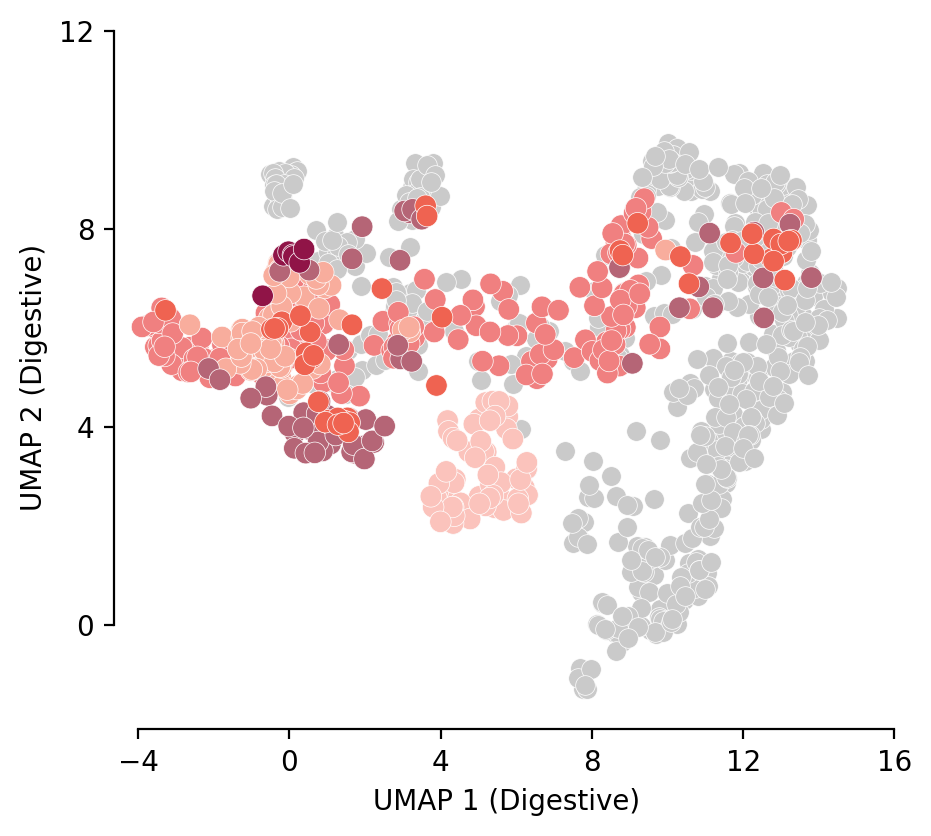

In [222]:
fig, ax = plt.subplots(figsize=(5,4.5))

sns.scatterplot(data=umap_df, x='0', y='1', color=c_default, legend=False, s=50, linewidth=0.25)

# digestive; dark salmon
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K5'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#f08080"], linewidth=0.25)
# esoph; light salmon
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K2'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#f8ad9d"], linewidth=0.25)
# an; dark red
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K6'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#B56576"], linewidth=0.25)

# maroon
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('I8'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#901447"], linewidth=0.25)

# orange
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K4'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#fbc3bc"], linewidth=0.25)

sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('R1'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#ef6351"], linewidth=0.25)

plt.xlim(-4.5, 16)
plt.ylim(-2, 12)

from matplotlib.ticker import MultipleLocator
ax.xaxis.set_major_locator(MultipleLocator(4))
ax.yaxis.set_major_locator(MultipleLocator(4))

sns.despine(top=True, trim=True, offset=2)

sns.despine(top=True, trim=True, offset=2)
plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

fig.savefig("umap_digestive.svg", dpi=450)

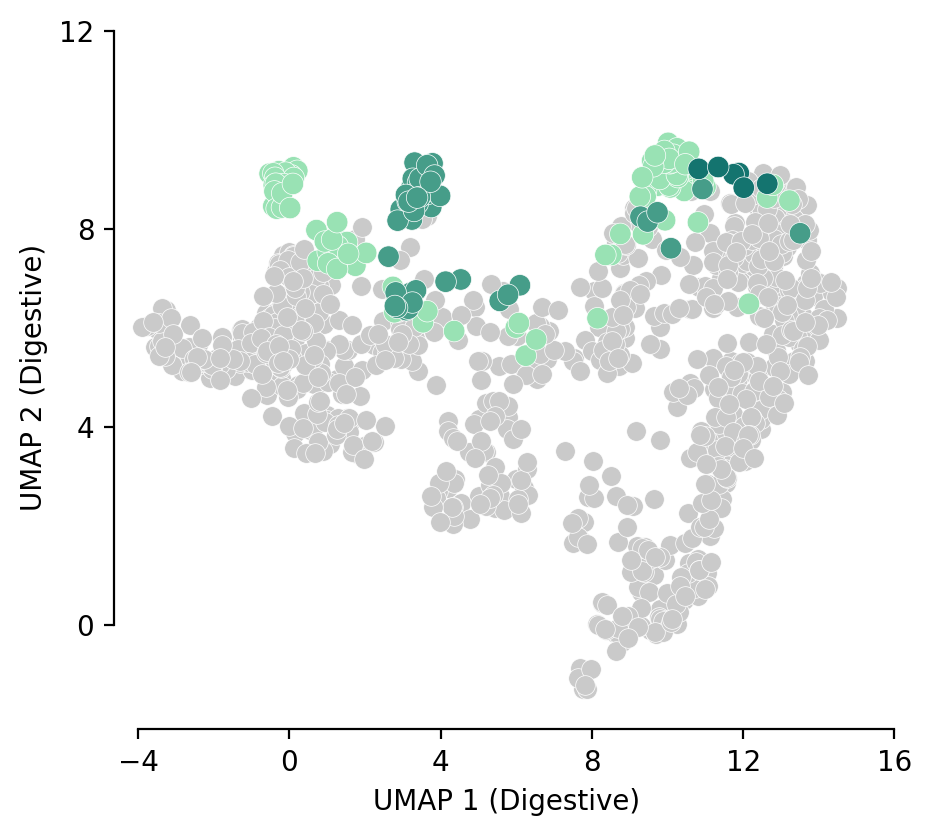

In [224]:
fig, ax = plt.subplots(figsize=(5, 4.5))

sns.scatterplot(data=umap_df, x='0', y='1', color=c_default, legend=False, s=50, linewidth=0.25)

sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K8'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#99e2b4"], linewidth=0.25)
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('K7'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#469d89"], linewidth=0.25)
sns.scatterplot(data=umap_df.loc[umap_df['original_code'].str.startswith(('T8'))], x='0', y='1', 
                hue='prefix', legend=False, s=60, palette=["#14746f"], linewidth=0.25)

plt.xlim(-4.5, 16)
plt.ylim(-2, 12)

from matplotlib.ticker import MultipleLocator
ax.xaxis.set_major_locator(MultipleLocator(4))
ax.yaxis.set_major_locator(MultipleLocator(4))

sns.despine(top=True, trim=True, offset=2)

plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

fig.savefig("umap_biliary.svg", dpi=450)

## Gradients

In [3]:
from sklearn.metrics.pairwise import cosine_similarity

In [4]:
core_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/data/SNOMEDCT_CORE_SUBSET_202411/SNOMEDCT_CORE_SUBSET_202411.txt", sep='|')
core_df = core_df.loc[core_df['SNOMED_CONCEPT_STATUS'] == 'Current']
core_df = core_df.assign(SNOMED_CID=core_df['SNOMED_CID'].astype(str))

In [14]:
phekg_node_df.loc[phekg_node_df['node_id'].isin(['695.42:phecode', '250.1:phecode'])]

,node_id,node_name,ntype,node_index,n_len,first_char,original_code
108724,250.1:phecode,Type 1 diabetes,PHECODE,108724,5,2,250.1
109765,695.42:phecode,Systemic lupus erythematosus,PHECODE,109765,6,6,695.42


In [15]:
concat_list = []
atc_inds = atc_df.loc[(atc_df['category'].isin(keep_atc_list)) & 
                      (atc_df['n_len']==5)]['node_index'].values.tolist()

concat_list.append(phekg_node_df.loc[phekg_node_df['node_id'].isin(['695.42:phecode', '250.1:phecode'])])
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(icd_inds)])
concat_list.append(phekg_node_df.loc[phekg_node_df['node_index'].isin(atc_inds)])
#concat_list.append(phekg_node_df.loc[(phekg_node_df['original_code'].isin(system_part_inds)) & (phekg_node_df['original_code'].isin(phemap_lnc))])
concat_list.append(phekg_node_df.loc[(phekg_node_df['ntype'] == 'SNOMEDCT_US') &
                                      (phekg_node_df['original_code'].isin(core_df['SNOMED_CID'].tolist()))])
concat_list.append(phekg_node_df.loc[(phekg_node_df['ntype'] == 'CPT') & (phekg_node_df['original_code'].isin(phemap_cpt))])
subset_node_df = pd.concat(concat_list)
subset_node_df.shape

(6951, 7)

In [16]:
import numpy as np

embed_list = []
for i, row in subset_node_df.iterrows():
    ntype = row['ntype']
    node_index = row['node_id'].split(':')[0]
    embed_list.append(phekg_all_dict[ntype][node_index])
    
embed_mat = np.array(embed_list) # n_neighbors=50, min_dist=0.4
reducer = umap.UMAP(n_neighbors=40, min_dist=0.2
                    , metric='cosine', n_components=2)
embedding_standard = reducer.fit_transform(embed_mat)


In [17]:
umap_df = subset_node_df.copy()
umap_df['0'] = embedding_standard[:, 0]
umap_df['1'] = embedding_standard[:, 1]

In [18]:
x = [phekg_icd_dict['M32.10']] # 
#x = [phekg_cui_dict['C0024141']]

sim_list = []

for i, row in subset_node_df.iterrows():
    y = [phekg_all_dict[row['ntype']][row['original_code']]]
    c = cosine_similarity(x, y)[0][0]
    sim_list.append(c) 
len(sim_list)
umap_df['cos'] = sim_list

In [ ]:
# lupus
fig_2d = px.scatter(
    umap_df.loc[umap_df['cos'] > -1.0], x='0', y='1', color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=600,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

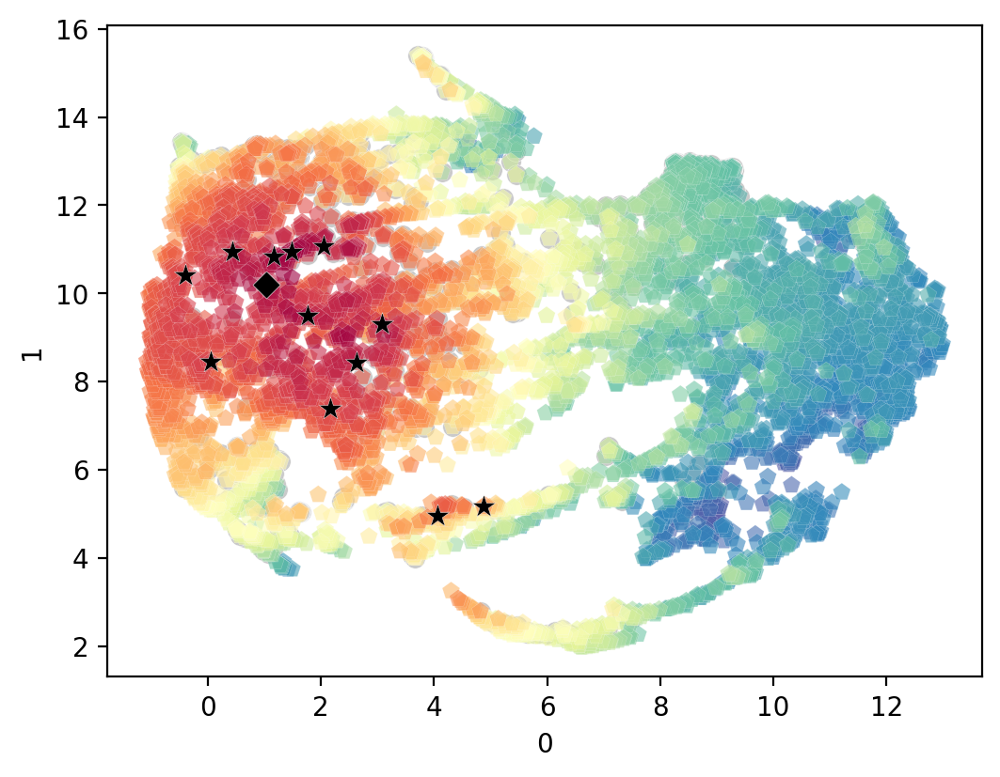

In [39]:
# lupus
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'

c_default = "#cacaca"

fig, ax = plt.subplots(figsize=(6,4.5))

sns.scatterplot(data=umap_df.loc[umap_df['ntype']=='ICD10CM'], x='0', y='1', linewidth=0.2, 
                edgecolor='white', s=60, color=c_default)

sns.scatterplot(data=umap_df.loc[umap_df['ntype'].isin(['CPT', 'ATC', 'SNOMEDCT_US', 'ICD10CM'])].sort_values(by='cos', ascending=True), x='0', y='1', hue='cos', linewidth=0.1, 
                edgecolor='white', alpha=0.6, marker='p', s=50, palette='Spectral_r', legend=False)

highlight_codes = ['422868009', '386705008', '85651', 'B02BD', 'D07AB', 'M34', 'D07XA',
                   '234347009', '52845002', '35885006', '118601006', '118600007']
highlight_df = umap_df.loc[umap_df['original_code'].isin(highlight_codes)]
sns.scatterplot(data=highlight_df, x='0', y='1', color='black', marker='*', linewidth=0.15, 
                edgecolor='white', alpha=1.0, s=85)

highlight_df = umap_df.loc[umap_df['original_code'].isin(['695.42'])]
sns.scatterplot(data=highlight_df, x='0', y='1', color='black', marker='D', linewidth=0.2, 
                edgecolor='white', alpha=1.0, s=55)
fig.savefig("umap_lupus.svg", dpi=450)

In [40]:
fig_2d = px.scatter(
    umap_df.loc[umap_df['original_code'].isin(highlight_codes)], x='0', y='1', color='cos',
hover_data=["node_name", "node_id"], text="node_name"
)
# hover name
fig_2d.update_layout(
    width=600,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [ ]:
highlight_codes = ['85651','6631009', '35885006', 'M34', '234347009', '118600007', '118601006', '64779008', '424131007', 'B02BD', '386705008', '52845002','D07XA', '68815009', 'D07AB', '46152009','422868009', '78700']
phekg_node_df.loc[phekg_node_df['original_code'].isin(highlight_codes)]

,node_id,node_name,ntype,node_index,n_len,first_char,original_code
19330,M34:icd10cm,Systemic sclerosis [scleroderma],ICD10CM,19330,3,M,M34
44977,B02BD:atc,Blood coagulation factors,ATC,44977,5,B,B02BD
49089,D07AB:atc,"Corticosteroids, moderately potent (group II)",ATC,49089,5,D,D07AB
49151,D07XA:atc,"Corticosteroids, weak, other combinations",ATC,49151,5,D,D07XA
76557,85651:cpt,"Sedimentation rate, erythrocyte; non-automated",CPT,76557,5,8,85651
77926,78700:cpt,Kidney imaging morphology,CPT,77926,5,7,78700
78528,234347009:snomedct_us,Anemia of chronic disease,SNOMEDCT_US,78528,9,2,234347009
78689,64779008:snomedct_us,Blood coagulation disorder,SNOMEDCT_US,78689,8,6,64779008
79024,46152009:snomedct_us,Dry eye syndrome,SNOMEDCT_US,79024,8,4,46152009
79700,68815009:snomedct_us,Lupus nephritis,SNOMEDCT_US,79700,8,6,68815009


In [383]:
umap_df.loc[umap_df['node_name'].str.lower().str.contains('hyperur')].sort_values(by='cos', ascending=False).head(20)

,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,cos
88796,35885006:snomedct_us,Hyperuricemia,SNOMEDCT_US,88796,8,3,35885006,5.139188,5.549565,0.460152


In [41]:
umap_df = subset_node_df.copy()
umap_df['0'] = embedding_standard[:, 0]
umap_df['1'] = embedding_standard[:, 1]

In [42]:
x = [phekg_icd_dict['E10']] # 
#x = [phekg_cui_dict['C0024141']]

sim_list = []

for i, row in subset_node_df.iterrows():
    y = [phekg_all_dict[row['ntype']][row['original_code']]]
    c = cosine_similarity(x, y)[0][0]
    sim_list.append(c) 
len(sim_list)
umap_df['cos'] = sim_list

In [43]:
fig_2d = px.scatter(
    umap_df.loc[umap_df['cos'] > -1.0], x='0', y='1', color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=600,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

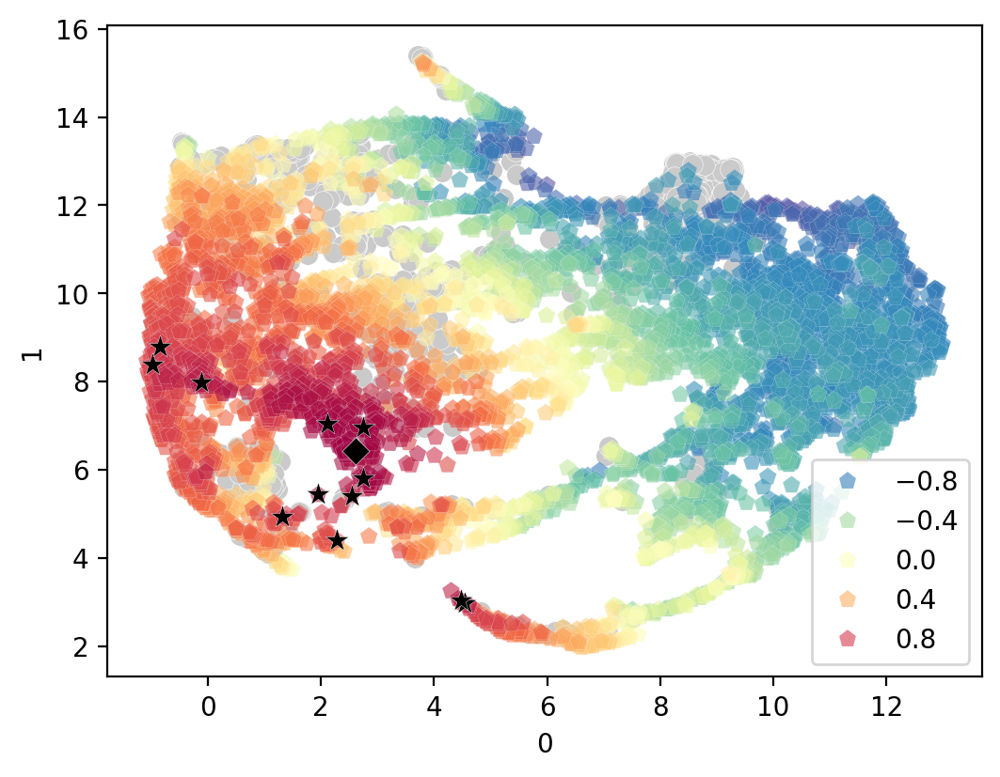

In [59]:
c_default = "#cacaca"

fig, ax = plt.subplots(figsize=(6,4.5))

sns.scatterplot(data=umap_df.loc[umap_df['ntype']=='ICD10CM'], x='0', y='1', linewidth=0.2, 
                edgecolor='white', s=60, color=c_default)

sns.scatterplot(data=umap_df.loc[umap_df['ntype'].isin(['CPT', 'ATC', 'SNOMEDCT_US'])].sort_values(by='cos', ascending=True), x='0', y='1', hue='cos', linewidth=0.1, 
                edgecolor='white', alpha=0.6, marker='p', s=50, palette='Spectral_r')

highlight_codes = ['80434', 'A10AD', 'A10AB', 'I15', '4855003', '37231002', '71444005', 'C07AA',
                   '125604000', '22298006', '201724008', '128608001']
highlight_df = umap_df.loc[umap_df['original_code'].isin(highlight_codes)]
sns.scatterplot(data=highlight_df, x='0', y='1', color='black', marker='*', linewidth=0.15, 
                edgecolor='white', alpha=1.0, s=85, legend=False)

highlight_df = umap_df.loc[umap_df['original_code'].isin(['E10'])]
sns.scatterplot(data=highlight_df, x='0', y='1', color='black', marker='D', linewidth=0.2, 
                edgecolor='white', alpha=1.0, s=55)

fig.savefig("umap_t1d.svg", dpi=450)

In [60]:
fig_2d = px.scatter(
    umap_df.loc[umap_df['original_code'].isin(highlight_codes)], x='0', y='1', color='cos',
hover_data=["node_name", "node_id"], text="node_name"
)
# hover name
fig_2d.update_layout(
    width=600,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [48]:
highlight_codes = ['421893009', '312912001', '80434', '2032001', '37231002', 'I16', '128608001', 
                                                          '125604000', '201724008', '71444005', 'I15', '22298006', 'C07AA', 'C03BA', '4855003', 'A10AD', 'A10AB']
phekg_node_df.loc[phekg_node_df['original_code'].isin(highlight_codes)]

,node_id,node_name,ntype,node_index,n_len,first_char,original_code
10689,I16:icd10cm,Hypertensive crisis,ICD10CM,10689,3,I,I16
12412,I15:icd10cm,Secondary hypertension,ICD10CM,12412,3,I,I15
47320,C07AA:atc,"Beta blocking agents, non-selective",ATC,47320,5,C,C07AA
48295,C03BA:atc,"sulfonamides, low-ceiling diuretics, plain",ATC,48295,5,C,C03BA
48960,A10AD:atc,Insulins and analogues for injection used in D...,ATC,48960,5,A,A10AD
49122,A10AB:atc,"Insulins and analogues for injection, fast-acting",ATC,49122,5,A,A10AB
76514,80434:cpt,Insulin tolerance panel; for ACTH insufficienc...,CPT,76514,5,8,80434
78703,2032001:snomedct_us,Cerebral edema,SNOMEDCT_US,78703,7,2,2032001
78984,4855003:snomedct_us,Diabetic retinopathy,SNOMEDCT_US,78984,7,4,4855003
79846,22298006:snomedct_us,Myocardial infarction,SNOMEDCT_US,79846,8,2,22298006


In [248]:
umap_df.loc[umap_df['original_code'].isin(['444551008'])]


,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,cos


In [215]:
umap_df.loc[(umap_df['node_name'].str.lower().str.contains(''))].sort_values(by='cos', ascending=False).head(50)

,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,cos
16447,E05:icd10cm,Thyrotoxicosis [hyperthyroidism],ICD10CM,16447,3,E,E05,2.206783,6.383183,0.994892
85360,237570007:snomedct_us,Multinodular goiter,SNOMEDCT_US,85360,9,2,237570007,2.248842,6.200300,0.988823
79279,56805008:snomedct_us,Endemic goiter,SNOMEDCT_US,79279,8,5,56805008,2.217231,6.413040,0.977201
80514,237495005:snomedct_us,Thyroid nodule,SNOMEDCT_US,80514,9,2,237495005,1.877417,6.692066,0.954463
82308,61167004:snomedct_us,Thyroid stimulating hormone measurement,SNOMEDCT_US,82308,8,6,61167004,1.919812,6.415043,0.952609
14146,E02:icd10cm,Subclinical iodine-deficiency hypothyroidism,ICD10CM,14146,3,E,E02,2.201434,6.471738,0.949603
81429,92439006:snomedct_us,Benign neoplasm of thyroid gland,SNOMEDCT_US,81429,8,9,92439006,2.490205,6.445639,0.947512
81455,26389007:snomedct_us,Toxic multinodular goiter,SNOMEDCT_US,81455,8,2,26389007,2.524926,5.868186,0.941895
82838,4997005:snomedct_us,Thyrotoxicosis factitia,SNOMEDCT_US,82838,7,4,4997005,2.035283,6.098207,0.924987
89857,370997001:snomedct_us,Primary testicular failure,SNOMEDCT_US,89857,9,3,370997001,2.476029,6.473240,0.924390


In [252]:
umap_df.loc[(umap_df['node_name'].str.lower().str.contains('iodine'))].sort_values(by='cos', ascending=False)

,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,cos
14146,E02:icd10cm,Subclinical iodine-deficiency hypothyroidism,ICD10CM,14146,3,E,E02,0.721151,5.949653,0.949603
93729,217710005:snomedct_us,Congenital iodine deficiency syndrome,SNOMEDCT_US,93729,9,2,217710005,0.314732,6.299509,0.918552
48277,D08AG:atc,"Iodine products, antiseptics and disinfectants",ATC,48277,5,D,D08AG,-0.397629,7.249228,0.838567
42922,E00:icd10cm,Congenital iodine-deficiency syndrome,ICD10CM,42922,3,E,E00,1.903918,5.976814,0.623848
81458,190279008:snomedct_us,Iodine hypothyroidism,SNOMEDCT_US,81458,9,1,190279008,9.323249,5.787390,0.146556
85349,40539002:snomedct_us,Hypothyroidism following radioiodine therapy,SNOMEDCT_US,85349,8,4,40539002,11.065589,5.147863,-0.323430


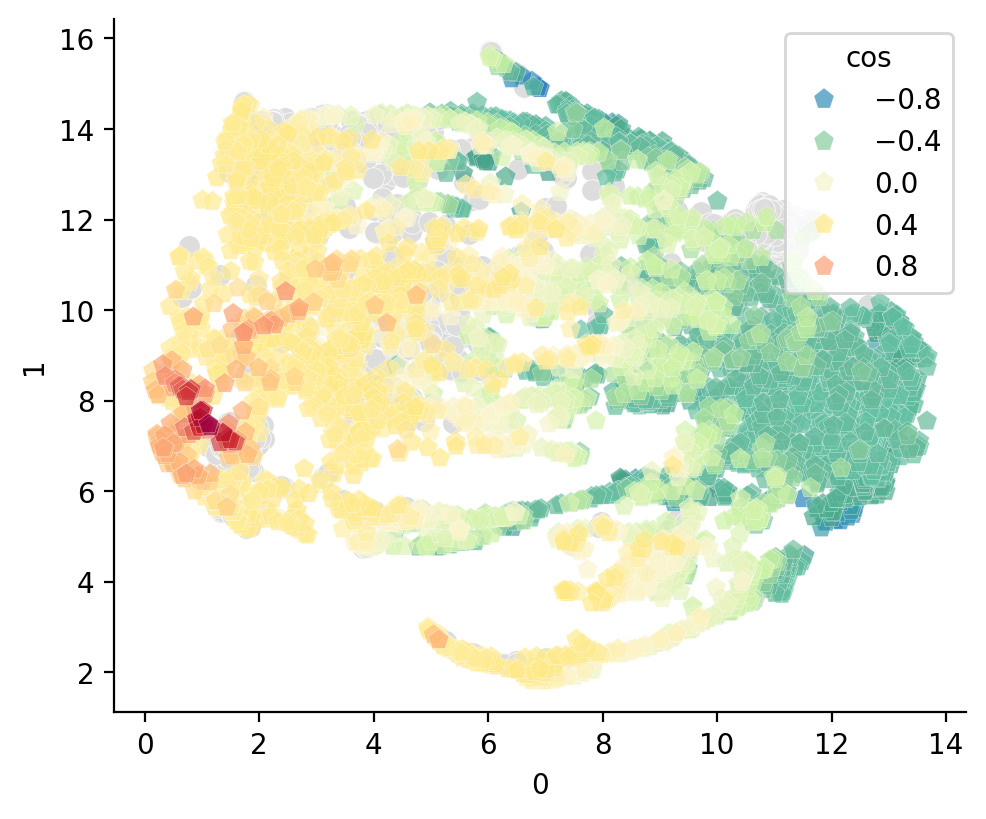

In [262]:
import matplotlib.colors

norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#332f9e"], # indigo 
          [norm(-0.98), "#1565c0"], # lighter indigo
          [norm(-0.95), "#1678b5"], # blue blue
          [norm(-0.9), "#3288bd"], # blue  
          [norm(-0.85), "#34a0a4"], # teal 
          [norm(-0.8), "#489fb5"], # lighter teal
          [norm(-0.75), "#47a386"], # leperchaun deeper green
          [norm(-0.6), "#66c2a5"], # brighter green 
          [norm(-0.5), "#67b99a"], # mid bright green
          [norm(-0.4), "#caf2a2"], # light green
          [norm( 0.0), "#fcf5d2"],# lighter muted yellow
          [norm( 0.35), "#ffe985"], # brighter muted yellow 
          [norm( 0.65), "#ffed9c"], # yellow
          [norm(0.75), "#ffba78"], # lighter orange
          [norm( 0.85), "#f68c70"], # bright orange
          [norm(0.95), "#c1121f"], # coral red
          [norm(1.0), "#9e0142"]] # dark red

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format='retina'
umap_df = umap_df.sort_values(by='cos')
c_default="#DDDDDD"

fig, ax = plt.subplots(figsize=(5.5,4.5))

sns.scatterplot(data=umap_df.loc[umap_df['ntype']=='ICD10CM'].sort_values(by='cos', ascending=True), x='0', y='1', linewidth=0.25, 
                edgecolor='white', s=60, color=c_default)

sns.scatterplot(data=umap_df.loc[umap_df['ntype']=='SNOMEDCT_US'], x='0', y='1', hue='cos', 
                linewidth=0.15, 
                edgecolor='white', alpha=0.7, marker='p', s=60, palette=cmap)

# LP14304-7 LP16010-8 LP68311-7 LP95494-8 LP15704-7
#highlight_df = umap_df.loc[umap_df['original_code'].isin(['LP14304-7', 'LP16010-8', 'LP68311-7', 'LP95494-8', 'LP15704-7'])]
#sns.scatterplot(data=highlight_df, x='0', y='1', color='black', marker='*', linewidth=0.15, 
#                edgecolor='white', alpha=0.60, s=60)

sns.despine(top=True)

In [362]:
umap_df.loc[umap_df['original_code'] == 'LP14304-7']

,node_id,node_name,ntype,node_index,n_len,first_char,original_code,0,1,cos
60532,LP14304-7:lnc,Erythrocytes,LNC,60532,9,L,LP14304-7,7.432896,7.655372,0.92082


In [ ]:
highlight_inds = [632, 24028, 507, 22075, 506, 23254, 23255, 
                  21433, 86141, 16786,
                  22075, 18404, 356, 193, 870,
                   85004 , 22785, 16588, 23284]
# antinuclear ab, urine, sed rate(cpt), sed rate(lnc), sed (cpt)
#   phospholipid, phospholipid, ribonuclear, comp factor H, comp C4, comp 3
#   C-protein, C-protein (cpt), Erythrocyte, Erythrocyte width, Eryth mcv,
# Prothrombin, PROTHROMBIN TIME, biopsy of kidney, muscle biopsy

In [386]:
cui_defn_df=pd.read_csv("/n/home01/ruthjohnson/ruthjohnson/kg_paper_revision/data/2024AB/META/MRSTY.RRF",
                          sep='|', header=None)

In [393]:
keep_groups = ['Amino Acid, Peptide, or Protein', 'Pharmacologic Substance',
       'Organic Chemical',
       'Enzyme', 'Biologically Active Substance',
        'Hormone',
        'Vitamin', 
       'Immunologic Factor',
       'Body Part, Organ, or Organ Component', 'Finding', 'Tissue', 'Diagnostic Procedure']

cui_keep_group = cui_defn_df.loc[cui_defn_df[3].isin(keep_groups)][0].tolist()

In [395]:
import duckdb 
#concept_duckfile=duckdb.read_csv("/n/home01/ruthjohnson/ruthjohnson/kg_paper_revision/data/2024AB/META/MRCONSO.ENG.RRF",
#                          sep='|', header=False)

# ATC
snomed_concept_df = duckdb.sql(
    f"""
    SELECT 
        f.*,
    FROM concept_duckfile as f
    WHERE 
    f.column02 = 'P'
    AND 
    f.column11 = 'LNC'
    AND f.column16 != 'O'
    AND
    f.column12 = 'LPN'
    """
    ).df()

snomed_concept_df.columns = ['CUI', 'LAT', 'TS', 'LUI', 'STT', 'SUI', 'ISPREF', 'AUI', 'SAUI', 'SCUI', 'SDUI', 'SAB', 'TTY', 'CODE','STR', 'SRL', 'SUPPRESS', 'CVF', 'x']

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [398]:
cui_keep_group = set(cui_keep_group)

#cui_lnc_dict = {}
keep_lnc_list = []
for i, row in snomed_concept_df[['CUI', 'CODE']].drop_duplicates().iterrows():
    k = row['CUI']
    v = (row['CODE'])
    if k in cui_keep_group:
        #cui_lnc_dict[k] = v
        keep_lnc_list.append(v)

In [ ]:
phekg_node_df.loc[phekg_node_df['node_name'].str.lower().str.contains('reactive pr') & (phekg_node_df['ntype'] == 'SNOMEDCT_US')]

,node_id,node_name,ntype,node_index,n_len,first_char,original_code


In [279]:
phekg_node_df.loc[phekg_node_df['node_name'].str.lower().str.contains('antinuclear') & (phekg_node_df['ntype'] == 'UMLS_CUI')]

,node_id,node_name,ntype,node_index,n_len,first_char,original_code
113403,C0003243:umls_cui,Antinuclear Antibodies,UMLS_CUI,113403,8,C,C0003243
127652,C0373828:umls_cui,ANTINUCLEAR ANTIBODIES ANA TITER,UMLS_CUI,127652,8,C,C0373828
128096,C0151480:umls_cui,Antinuclear Antibody Positive,UMLS_CUI,128096,8,C,C0151480
145459,C2732788:umls_cui,Speckled antinuclear antibody pattern (finding),UMLS_CUI,145459,8,C,C2732788


In [ ]:
x = [phekg_cui_dict['C0024141']]
y = [phekg_lnc_dict['LP15704-7']] # LP14304-7 LP16010-8 LP68311-7 LP95494-8 LP15704-7
y = [phekg_cui_dict['C0006560']] 
cosine_similarity(x, y)

array([[0.8245398]], dtype=float32)

In [429]:
'C0024141' in core_cui

True

In [281]:
x = [phekg_cui_dict['C0024141']]
#x = [phekg_phecode_dict['695.42']]
#y = [phekg_snomed_dict['61425002']] # LP14304-7 LP16010-8 LP68311-7 LP95494-8 LP15704-7
y = [phekg_cui_dict['C0003243']] # C0006560

cosine_similarity(x, y)

array([[0.87831664]], dtype=float32)

In [304]:
'C0006560' in core_cui

False